<a href="https://colab.research.google.com/github/hieurichard/DataScience_Course/blob/main/Classification_of_plants_of_Southeast_Asia_project.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Tên dự án: Phân biệt các loài cây đặc thù khu vực Đông Nam Á



Dự án này sẽ phân biệt 26 loài cây bản địa của khu vực đông nam á. bộ dữ liệu đang có sẵn trong cuộc thi của kaggle

đường link : https://www.kaggle.com/competitions/classification-of-plants-of-southeast-asia

1. chúng ta sẽ sử dụng mạng CNN để giải quyết bài toán này. các thư viện cần thiết là tensorflow để train model, numpy, matplotlib ..

2. Chuẩn bị bộ dữ liệu và tiền xử lý

3. Xây dựng mạng CNN và sử dụng metric là accuracy

4. tinh chỉnh model

## I: tạo môi trường, import thư viện và chuẩn bị bộ dữ liệu

chống disconnect trong lúc train model: vào console và paste lệnh trên

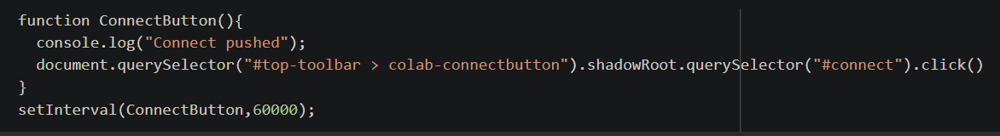

In [7]:
# kết nối gpu
!nvidia-smi

NVIDIA-SMI has failed because it couldn't communicate with the NVIDIA driver. Make sure that the latest NVIDIA driver is installed and running.



In [8]:
# Import những thư viện cần thiết
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import os
import cv2

#### chuẩn bị dữ liệu (tải dữ liệu từ kaggle về google drive của mình để sử dụng nhiều lần sau)

In [ ]:
# Install thư viện Kaggle

# ! pip install kaggle

# 2. tạo 1 directory tên “.kaggle”
# 
# ! mkdir ~/.kaggle

# 3. Copy  “kaggle.json” vào directory mới

# ! cp kaggle.json ~/.kaggle/

# 4. Allocate the required permission for this file.

# ! chmod 600 ~/.kaggle/kaggle.json

In [ ]:
# tải bộ dữ liệu trên kaggle về google colab

# ! kaggle competitions download classification-of-plants-of-southeast-asia

# copy vào google drive
# !cp classification-of-plants-of-southeast-asia.zip /content/gdrive/MyDrive/image/plant

#### load dữ liệu từ google drive và giải nén trong google colab

In [9]:
from google.colab import drive
drive.mount('/content/drive/')

Mounted at /content/drive/


In [10]:
from pathlib import Path

link = Path('/content/drive/MyDrive/classification-of-plants-of-southeast-asia.zip')
!cp "{link}" .

link = Path('/content/drive/MyDrive/image/plant/classification-of-plants-of-southeast-asia.zip')
!cp "{link}" .

!unzip -q /content/classification-of-plants-of-southeast-asia.zip
!rm /content/classification-of-plants-of-southeast-asia.zip

cp: cannot stat '/content/drive/MyDrive/classification-of-plants-of-southeast-asia.zip': No such file or directory


## II: tìm hiểu dữ liệu và tiền xử lý

### tìm hiểu qua về dữ liệu

In [ ]:
#  xác định sô lượng ảnh và class của bộ dữ liệu

noi = 0 # number of image
dic = {}
for i in (os.listdir('/content/bali-26_train/bali-26_train')):
  n = len(os.listdir(f'/content/bali-26_train/bali-26_train/{i}'))
  dic[i] = n
  noi += n

classes = sorted(list(dic.keys()))
noi

41607

In [ ]:
classes

['bamboo',
 'banana',
 'cacao',
 'cinnamon',
 'coffeearabica',
 'dragonfruit',
 'durian',
 'frangipani',
 'guava',
 'jackfruit',
 'lychee',
 'mango',
 'mangosteen',
 'nilam',
 'papaya',
 'passiflora',
 'sawo',
 'snakefruit',
 'starfruit',
 'sugarpalm',
 'suweg',
 'taro',
 'vanilla',
 'waterguava',
 'whitepepper',
 'zodia']

dữ liệu train có 41.607 bức ảnh gồm có 26 loại cây

In [ ]:
# kiem tra size ảnh cua tap train
for classi in os.listdir('/content/bali-26_train/bali-26_train/'):
  set1 = set()
  for j in os.listdir(f'/content/bali-26_train/bali-26_train/{classi}'):
    size_img = tf.keras.preprocessing.image.load_img(f'/content/bali-26_train/bali-26_train/{classi}/{j}').size
    set1.add(size_img)
  print(classi,':',set1)

dragonfruit : {(1080, 1920), (1920, 1080)}
coffeearabica : {(1080, 1920), (1920, 1080)}
lychee : {(1920, 1080)}
durian : {(1080, 1920), (1920, 1080)}
snakefruit : {(1080, 1920), (1920, 1080)}
papaya : {(1080, 1920), (1920, 1080)}
guava : {(1080, 1920), (1920, 1080)}
banana : {(1080, 1920), (1920, 1080)}
passiflora : {(1080, 1920), (1920, 1080)}
frangipani : {(1080, 1920), (1920, 1080)}
cinnamon : {(1080, 1920), (1920, 1080)}
whitepepper : {(1080, 1920), (1920, 1080)}
zodia : {(1080, 1920), (1920, 1080)}
sugarpalm : {(1080, 1920), (1920, 1080)}
suweg : {(1080, 1920), (1920, 1080)}
sawo : {(1920, 1080)}
waterguava : {(1920, 1080)}
bamboo : {(720, 1280), (1080, 1920), (1920, 1080)}
mangosteen : {(1920, 1080)}
starfruit : {(1080, 1920), (1920, 1080)}
taro : {(1080, 1920), (1920, 1080)}
jackfruit : {(1080, 1920), (1920, 1080)}
cacao : {(1920, 1080)}
mango : {(1080, 1920), (1920, 1080)}
nilam : {(1080, 1920), (1920, 1080)}
vanilla : {(1080, 1920), (1920, 1080)}


In [ ]:
# kiem tra size ảnh cua tap test
names = os.listdir('/content/bali-26_test/bali-26_test')
set1 = set()
for i in range(len(names)):
  a = tf.keras.preprocessing.image.load_img(f'/content/bali-26_test/bali-26_test/{names[i]}').size
  set1.add(a)
set1

{(720, 1280), (1080, 1920), (1920, 1080)}

các bức ảnh có size chủ yếu là 1080 x 1920 hoặc 1920 x 1080

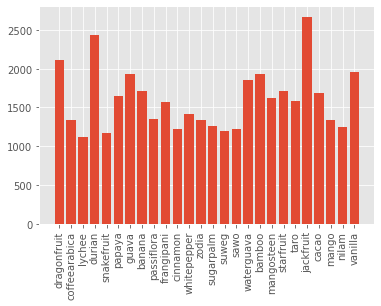

In [ ]:
# kiểm tra dữ liệu có balance không
plt.style.use('ggplot')
plt.figure(figsize = (6,4))
plt.bar(dic.keys(),dic.values())
plt.xticks(rotation = 90);

Ta thấy không có sự chênh lệch quá đáng kể giữa các class, ta sử dụng metric là accuracy để giải quyết bài toán này

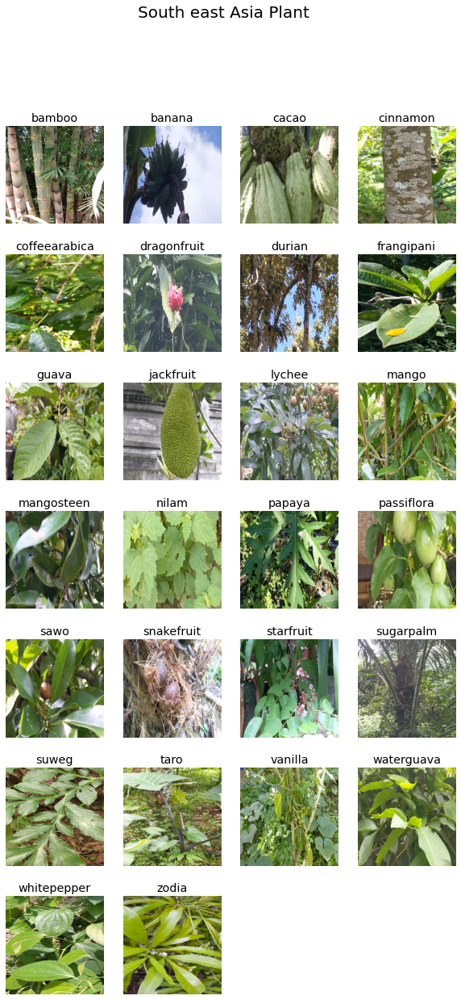

In [ ]:
#  show mỗi loại 1 ảnh
fig, ax = plt.subplots(7,4,figsize = (10,20))
for i,axi in enumerate(ax.flatten()[:-2]):
  classi = classes[i]
  random_img = np.random.choice(os.listdir(f'/content/bali-26_train/bali-26_train/{classi}'))
  img = tf.keras.preprocessing.image.load_img(f'/content/bali-26_train/bali-26_train/{classi}/{random_img}',target_size = (224,224))
  axi.imshow(img)
  axi.axis('off')
  axi.set_title(classi)
ax.flatten()[-2].set_visible(False)
ax.flatten()[-1].set_visible(False)
plt.suptitle('South east Asia Plant',size = 20);

ta thấy các loại cây có đặc điểm riêng biệt về lá, thân, quả  ...

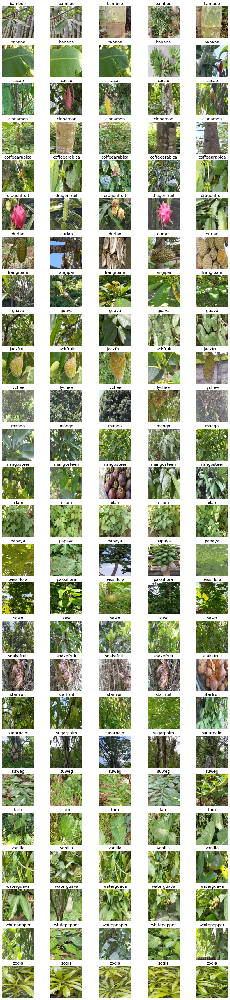

In [ ]:
# show 5 ảnh cho mỗi cây
fig, ax = plt.subplots(26,5,figsize = (15,65))
for i,axi in enumerate(ax.flatten()):
  classi = classes[i//5]
  random_img = np.random.choice(os.listdir(f'/content/bali-26_train/bali-26_train/{classi}'))
  img = tf.keras.preprocessing.image.load_img(f'/content/bali-26_train/bali-26_train/{classi}/{random_img}',target_size = (224,224))
  axi.imshow(img)
  axi.axis('off')
  axi.set_title(classi)

Các ảnh sẽ chụp vị trí khác nhau trên cây: lá, thân, quả , hoa ...

bức ảnh đang có tỉ lệ khác nhau do chụp ngang, chụp dọc: ta có thể crop chính giữa của ảnh 

In [ ]:
# tạo hàm để crop image ở giữa
def crop_image(image):
  image = np.array(image)
  width, height = image.shape[:2]   # Get dimensions
  new_width = min(width,height)
  new_height = new_width
  left = (width - new_width)//2
  top = (height - new_height)//2
  right = (width + new_width)//2
  bottom = (height + new_height)//2

  # Crop the center of the image
  im = image[left:right,top:bottom,:]
  return im

Text(0.5, 1.0, 'Trans image')

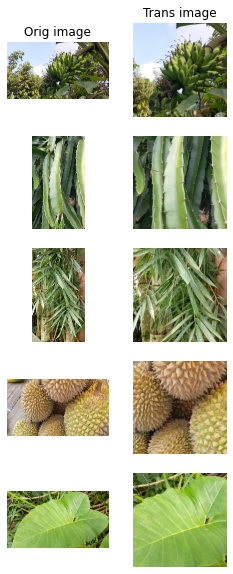

In [ ]:
fig,ax = plt.subplots(5,2,figsize = (4,10))
file_name = os.listdir('/content/bali-26_test/bali-26_test/')
random_img = np.random.choice(file_name,5)
for i,img in enumerate(random_img):
  orig_img = tf.keras.preprocessing.image.load_img(f'/content/bali-26_test/bali-26_test/{img}')
  tran_img = crop_image(orig_img)
  ax[i,0].imshow(np.array(orig_img))
  ax[i,1].imshow(np.array(tran_img))
  ax[i,0].axis('off')
  ax[i,1].axis('off')
ax[0,0].set_title('Orig image')
ax[0,1].set_title('Trans image')

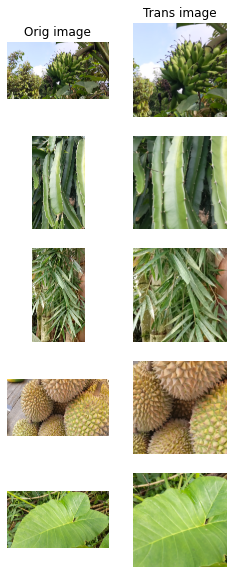

ảnh sau khi crop không mất quá nhiều đặc trưng của cây

tách dữ liệu thành tập train và validation


In [ ]:
# sử dụng split folder để tách thành tập train và val
!pip -q install split_folders
import splitfolders
input_folder = "/content/bali-26_train/bali-26_train"
output = "/content/bali-26_train/train_val/" #where you want the split datasets saved. one will be created if none is set
 
splitfolders.ratio(input_folder, output=output, seed=42, ratio=(.8, .2)) # ratio of split are in order of train/val/test. You can change to whatever you want. For train/val sets only, you could do .75, .25 for example.


Copying files: 41607 files [00:41, 998.01 files/s]


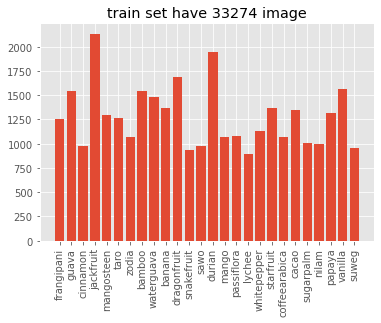

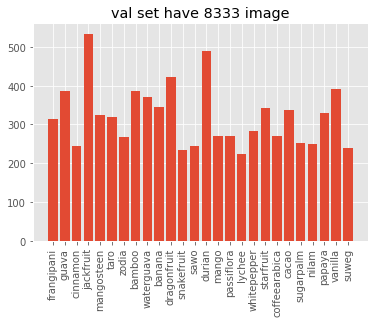

''

In [ ]:
#  xem lại số lượng ảnh và phân phối của tập train và validation

noi_train = 0 # number of image
dic_train = {}
for i in (os.listdir('/content/bali-26_train/train_val/train')):
  n = len(os.listdir(f'/content/bali-26_train/train_val/train/{i}'))
  dic_train[i] = n
  noi_train += n

noi_val = 0 # number of image
dic_val = {}
for i in (os.listdir('/content/bali-26_train/train_val/val')):
  n = len(os.listdir(f'/content/bali-26_train/train_val/val/{i}'))
  dic_val[i] = n
  noi_val += n


plt.style.use('ggplot')
plt.bar(dic_train.keys(),dic_train.values())
plt.xticks(rotation = 90)
plt.title(f'train set have {noi_train} image')
plt.show()

plt.bar(dic_val.keys(),dic_val.values())
plt.xticks(rotation = 90)
plt.title(f'val set have {noi_val} image')
plt.show()
;

Như vậy tập train có 33.274 ảnh , tập val có 8.333 ảnh , phân phối giữa các class trong 2 tập là như nhau

Tiền Xử lý dữ liệu: rescle dữ liệu để giá trị pixel nằm trong khoảng từ 0 đến 1, chuyển ảnh về size là 128 x 128 pixel, batch size là 32

In [ ]:
# tiền sử lý tập train và val và không sử dụng crop
generator = tf.keras.preprocessing.image.ImageDataGenerator(rescale=1./255)
train_data_gen_nocrop = generator.flow_from_directory('/content/bali-26_train/train_val/train',target_size=(128,128))
val_data_gen_nocrop = generator.flow_from_directory('/content/bali-26_train/train_val/val',target_size=(128,128))


# tiền sử lý tập train và val và sử dụng crop
train_generator = tf.keras.preprocessing.image.ImageDataGenerator(rescale = 1./255,preprocessing_function = crop_image,zoom_range=0.2,
                                                                  horizontal_flip=True, vertical_flip=True)
train_data_gen = train_generator.flow_from_directory(directory='/content/bali-26_train/train_val/train', target_size= (128,128))

val_generator = tf.keras.preprocessing.image.ImageDataGenerator(rescale = 1./255,preprocessing_function = crop_image)
val_data_gen = val_generator.flow_from_directory(directory='/content/bali-26_train/train_val/val', target_size= (128,128))




Found 33274 images belonging to 26 classes.
Found 8333 images belonging to 26 classes.
Found 33274 images belonging to 26 classes.
Found 8333 images belonging to 26 classes.


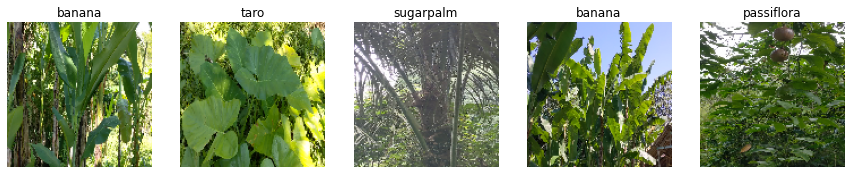

In [ ]:
# show 1 số hình ảnh trong tập dataset sau khi preprocessing
# tập không crop
X,y = next(train_data_gen_nocrop)
fig, ax = plt.subplots(1,5,figsize = (15,3))
for i,axi in enumerate(ax.flatten()):
  axi.imshow(X[i])
  axi.axis('off')
  axi.set_title(classes[np.argmax(y[i])])

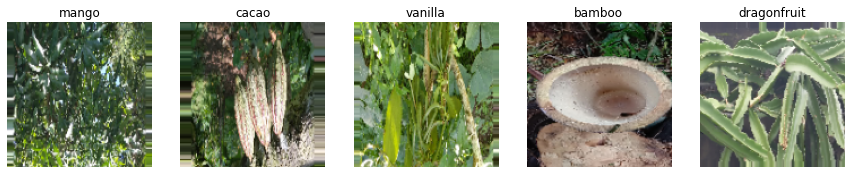

In [ ]:
# show 1 số hình ảnh trong tập dataset sau khi preprocessing
# tập  crop và có agumentation
X,y = next(train_data_gen)
fig, ax = plt.subplots(1,5,figsize = (15,3))
for i,axi in enumerate(ax.flatten()):
  axi.imshow(X[i])
  axi.axis('off')
  axi.set_title(classes[np.argmax(y[i])])

## III xây dựng và train model

#### tạo hàm để visualize learning curve

In [ ]:
def get_list_loss_accuracy(string):
    loss = float(string[string.find(' loss: ') + 7:string.find('loss: ') + 7 + 6])
    accuracy = float(string[string.find(' accuracy: ')+11:string.find('accuracy: ')+11+6])
    val_loss = float(string[string.find('val_loss: ') + 10:string.find('val_loss: ') + 7 + 6+3])
    val_accuracy = float(string[string.find('val_accuracy: ')+14:string.find('val_accuracy: ')+11+6+3])
    return loss,accuracy,val_loss,val_accuracy

def get_loss_acc_from_string(string):
    loss, accuracy,val_loss, val_accuracy = [],[],[],[]
    for sub_string in string.split('Epoch')[2::2]:
        los, acc, val_los, val_acc = get_list_loss_accuracy(sub_string)
        loss.append( los)
        accuracy.append( acc)
        val_loss.append(val_los)
        val_accuracy.append(val_acc)
    return loss,accuracy,val_loss,val_accuracy

def learning_curve(string,num_epochs):
  loss,accuracy,val_loss,val_accuracy = get_loss_acc_from_string(string)
  fig, ax = plt.subplots(1,2, figsize = (12,6))
  ax[0].plot(loss,label='loss')
  ax[0].plot(val_loss,label = 'val_loss')
  ax[0].set_title(f'Loss Vs. Val Loss in {num_epochs} Epochs')
  ax[0].set_xticks(np.arange(0,num_epochs+1,2)+1)
  ax[0].legend()
  ax[1].plot(accuracy, label = 'acc')
  ax[1].plot(val_accuracy, label = 'val_acc')
  ax[1].set_title(f'Accuracy Vs. Val Accuracy in {num_epochs} Epochs')
  ax[1].set_xticks(np.arange(0,num_epochs+1,2)+1)
  ax[1].legend()
  plt.show()

### Xây dựng model
ta sẽ xây dựng 1 CNN model gồm có 4 convolution layer để trích xuất đặc trưng của ảnh với layer sau sẽ có số unit lớn hơn để trích xuất các đặc trưng chi tiết hơn 

sử dụng MaxPooling để giảm kích thước giúp model nhẹ hơn và cũng để tăng cường đặc trưng

Sử dụng Batchnorm để chuẩn hóa đẩu vào giúp mô hình chạy hiệu quả và nhanh đạt đến kết quả hơn

In [ ]:
def create_baseline_model():
    '''
    Return: 
        CNN model with 13 layers.
    '''
    
    model = tf.keras.models.Sequential([
        tf.keras.layers.Conv2D(8,(3,3),padding = 'same',activation = 'relu', input_shape = train_data_gen.image_shape,name = 'Layer1'),
        tf.keras.layers.BatchNormalization(),
        tf.keras.layers.Conv2D(16,(3,3),padding = 'same',activation = 'relu',name = 'Layer2'),
        tf.keras.layers.BatchNormalization(),
        tf.keras.layers.MaxPooling2D((2,2),name = 'Layer3'),

        tf.keras.layers.Conv2D(32,(3,3),padding = 'same',activation = 'relu',name = 'Layer4'),
        tf.keras.layers.BatchNormalization(),
        tf.keras.layers.Conv2D(64,(3,3),padding = 'same',activation = 'relu',name ='Layer5'),
        tf.keras.layers.BatchNormalization(),
        tf.keras.layers.MaxPooling2D((3,3),name = 'Layer6'),

        tf.keras.layers.Flatten(name = 'Layer7'),
        tf.keras.layers.Dense(100,'relu',name = 'Layer8'),
        tf.keras.layers.BatchNormalization(),

        tf.keras.layers.Dense(26,'softmax',name = 'Layer9')
    ])

    return model

model = create_baseline_model()

sử dụng optimizer là Adam, vì bài toán phân loại nhiều class nên loss function là categorical crossentropy và metrics là accuracy vì không bị mất cân bằng (imbalance) giữa các lớp

In [ ]:
model.compile('adam','categorical_crossentropy',['accuracy'])

Xây dựng 1 số callback: 

tensorboard để trực quan hóa kết quả

model checkpoint để lưu best model 

ReduceLROnPlateau: giảm learning rate khi model không cải thiện

In [ ]:
import datetime
logdir = os.path.join('logs2', datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
tsb=tf.keras.callbacks.TensorBoard(log_dir=logdir,histogram_freq=1)
mdcp = tf.keras.callbacks.ModelCheckpoint('/content/drive/MyDrive/asia_plant_baseline.h5',verbose = 1,monitor = 'val_accuracy',save_best_only=True)
rdlr = tf.keras.callbacks.ReduceLROnPlateau(monitor ='val_accuracy', patience = 3)

Train model

In [ ]:
history = model.fit(train_data_gen,validation_data = val_data_gen, epochs = 10,
                             callbacks = [rdlr,mdcp,tsb])

Epoch 1/10
1040/1040 [==============================] - ETA: 0s - loss: 1.4390 - accuracy: 0.5931
Epoch 1: val_accuracy improved from -inf to 0.61742, saving model to /content/drive/MyDrive/asia_plant_baseline.h5
1040/1040 [==============================] - 1057s 1s/step - loss: 1.4390 - accuracy: 0.5931 - val_loss: 1.3114 - val_accuracy: 0.6174 - lr: 0.0010
Epoch 2/10
1040/1040 [==============================] - ETA: 0s - loss: 0.6815 - accuracy: 0.8008
Epoch 2: val_accuracy improved from 0.61742 to 0.75495, saving model to /content/drive/MyDrive/asia_plant_baseline.h5
1040/1040 [==============================] - 1277s 1s/step - loss: 0.6815 - accuracy: 0.8008 - val_loss: 0.8042 - val_accuracy: 0.7550 - lr: 0.0010
Epoch 3/10
1040/1040 [==============================] - ETA: 0s - loss: 0.4215 - accuracy: 0.8748
Epoch 3: val_accuracy improved from 0.75495 to 0.84063, saving model to /content/drive/MyDrive/asia_plant_baseline.h5
1040/1040 [==============================] - 1249s 1s/step 

In [ ]:
history = model.fit(train_data_gen,validation_data = val_data_gen, epochs = 10,
                             callbacks = [rdlr,mdcp,tsb])

Epoch 1/10
1040/1040 [==============================] - ETA: 0s - loss: 0.0688 - accuracy: 0.9805
Epoch 1: val_accuracy improved from 0.94912 to 0.95392, saving model to /content/drive/MyDrive/asia_plant_baseline.h5
1040/1040 [==============================] - 1287s 1s/step - loss: 0.0688 - accuracy: 0.9805 - val_loss: 0.1489 - val_accuracy: 0.9539 - lr: 1.0000e-04
Epoch 2/10
1040/1040 [==============================] - ETA: 0s - loss: 0.0674 - accuracy: 0.9814
Epoch 2: val_accuracy did not improve from 0.95392
1040/1040 [==============================] - 1298s 1s/step - loss: 0.0674 - accuracy: 0.9814 - val_loss: 0.1456 - val_accuracy: 0.9518 - lr: 1.0000e-04
Epoch 3/10
 163/1040 [===>..........................] - ETA: 14:53 - loss: 0.0546 - accuracy: 0.9864

In [ ]:

history = model.fit(train_data_gen,validation_data = val_data_gen, epochs = 10,
                             callbacks = [rdlr,mdcp,tsb])

Epoch 1/10
1040/1040 [==============================] - ETA: 0s - loss: 0.0669 - accuracy: 0.9814
Epoch 1: val_accuracy improved from -inf to 0.95200, saving model to /content/drive/MyDrive/asia_plant_baseline.h5
1040/1040 [==============================] - 1006s 965ms/step - loss: 0.0669 - accuracy: 0.9814 - val_loss: 0.1593 - val_accuracy: 0.9520 - lr: 1.0000e-04
Epoch 2/10
1040/1040 [==============================] - ETA: 0s - loss: 0.0602 - accuracy: 0.9832
Epoch 2: val_accuracy improved from 0.95200 to 0.96088, saving model to /content/drive/MyDrive/asia_plant_baseline.h5
1040/1040 [==============================] - 976s 939ms/step - loss: 0.0602 - accuracy: 0.9832 - val_loss: 0.1220 - val_accuracy: 0.9609 - lr: 1.0000e-04
Epoch 3/10
1040/1040 [==============================] - ETA: 0s - loss: 0.0582 - accuracy: 0.9828
Epoch 3: val_accuracy improved from 0.96088 to 0.96280, saving model to /content/drive/MyDrive/asia_plant_baseline.h5
1040/1040 [==============================] - 1

Vẽ Learning curve

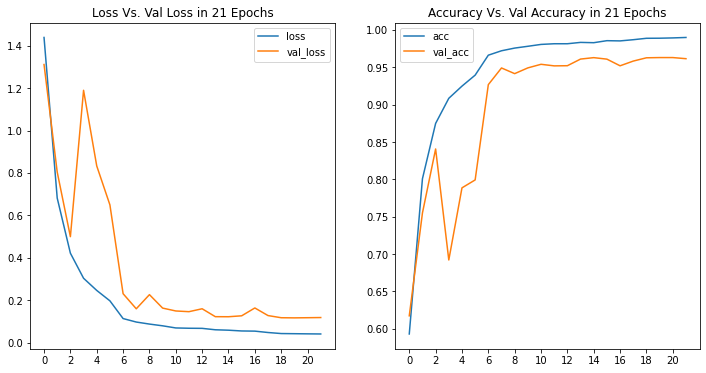

Đánh giá: model đạt accuracy trên tập train là 0.9898 và tập test là 0.9614, kết quả tương đối ổn



Xem model hoạt động trên tập test

In [ ]:
# thực hiện dự đoán trên tập test và submit kết quả lên kaggle

# load best model từ file đã lưu bằng model checkpoint
best_model = tf.keras.models.load_model('/content/drive/MyDrive/asia_plant_baseline.h5')

# tiền xử lý dữ liệu test
test_generator = tf.keras.preprocessing.image.ImageDataGenerator(rescale = 1./255)
test_data_gen = test_generator.flow_from_directory(directory='/content/bali-26_test', target_size= (128,128),shuffle=False)

# sử dụng model đã train để dự đoán
pred = best_model.predict(test_data_gen)
pred = pred.argmax(axis=1)

# ghi kết qua theo đúng format ra file csv
with open('predict.csv','w') as f:
  f.write(f'id,category\n')
  for name,clas in zip(test_data_gen.filenames,pred):
    a = name.split('/')[1]
    f.write(f'{a},{classes[clas]}\n')

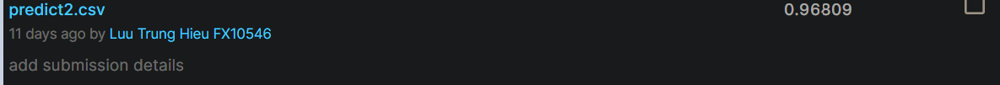

Kết quả đạt được là 0.96809 trên tập test

## IV cải thiện mô hình

### tinh chỉnh model:

- thêm convolution layer

In [ ]:
def create_model():
    '''
    Return: 
        CNN model with 13 layers.
    '''
    
    model = tf.keras.models.Sequential([
        tf.keras.layers.Conv2D(8,(3,3),padding = 'same',activation = 'relu', input_shape = train_data_gen.image_shape,name = 'Layer1'),
        tf.keras.layers.BatchNormalization(),
        tf.keras.layers.Conv2D(16,(3,3),padding = 'same',activation = 'relu',name = 'Layer2'),
        tf.keras.layers.BatchNormalization(),
        tf.keras.layers.MaxPooling2D((2,2),name = 'Layer3'),

        tf.keras.layers.Conv2D(32,(3,3),padding = 'same',activation = 'relu',name = 'Layer4'),
        tf.keras.layers.BatchNormalization(),
        tf.keras.layers.Conv2D(64,(3,3),padding = 'same',activation = 'relu',name ='Layer5'),
        tf.keras.layers.BatchNormalization(),
        tf.keras.layers.MaxPooling2D((3,3),name = 'Layer6'),

        tf.keras.layers.Conv2D(128,(3,3),padding = 'same',activation = 'relu',name = 'Layer7'),
        tf.keras.layers.BatchNormalization(),

        tf.keras.layers.Flatten(name = 'Layer10'),
        tf.keras.layers.Dense(100,'relu',name = 'Layer11'),
        tf.keras.layers.BatchNormalization(),
        tf.keras.layers.Dropout(rate = 0.5,name = 'Layer12'),

        tf.keras.layers.Dense(26,'softmax',name = 'Layer13')
    ])

    return model

model = create_model()

model.compile('adam','categorical_crossentropy',['accuracy'])

import datetime
logdir = os.path.join('logs2', datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
tsb=tf.keras.callbacks.TensorBoard(log_dir=logdir,histogram_freq=1)
mdcp = tf.keras.callbacks.ModelCheckpoint('/content/drive/MyDrive/asia_plant_nocrop_simpler.h5',verbose = 1,monitor = 'val_accuracy',save_best_only=True)
rdlr = tf.keras.callbacks.ReduceLROnPlateau(monitor ='val_accuracy', patience = 3)
es = tf.keras.callbacks.EarlyStopping(monitor='val_accuracy', min_delta=0.01,patience=3)


history = model.fit(train_data_gen_nocrop,validation_data = val_data_gen_nocrop, epochs = 10,
                             callbacks = [rdlr,mdcp,tsb,es])


Found 33274 images belonging to 26 classes.
Found 8333 images belonging to 26 classes.
Epoch 1/10
1040/1040 [==============================] - ETA: 0s - loss: 1.0250 - accuracy: 0.7207
Epoch 1: val_accuracy improved from -inf to 0.92104, saving model to /content/drive/MyDrive/asia_plant_nocrop_simpler.h5
1040/1040 [==============================] - 1078s 1s/step - loss: 1.0250 - accuracy: 0.7207 - val_loss: 0.3054 - val_accuracy: 0.9210 - lr: 0.0010
Epoch 2/10
1040/1040 [==============================] - ETA: 0s - loss: 0.1865 - accuracy: 0.9516
Epoch 2: val_accuracy improved from 0.92104 to 0.97732, saving model to /content/drive/MyDrive/asia_plant_nocrop_simpler.h5
1040/1040 [==============================] - 1116s 1s/step - loss: 0.1865 - accuracy: 0.9516 - val_loss: 0.0833 - val_accuracy: 0.9773 - lr: 0.0010
Epoch 3/10
1040/1040 [==============================] - ETA: 0s - loss: 0.0904 - accuracy: 0.9751
Epoch 3: val_accuracy did not improve from 0.97732
1040/1040 [================

In [ ]:
history = model.fit(train_data_gen_nocrop,validation_data = val_data_gen_nocrop, epochs = 10,
                             callbacks = [rdlr,mdcp,tsb,es])

Epoch 1/10
1040/1040 [==============================] - ETA: 0s - loss: 0.0416 - accuracy: 0.9876
Epoch 1: val_accuracy improved from 0.97948 to 0.98416, saving model to /content/drive/MyDrive/asia_plant_nocrop_simpler.h5
1040/1040 [==============================] - 1550s 1s/step - loss: 0.0416 - accuracy: 0.9876 - val_loss: 0.0578 - val_accuracy: 0.9842 - lr: 0.0010
Epoch 2/10
1040/1040 [==============================] - ETA: 0s - loss: 0.0488 - accuracy: 0.9850
Epoch 2: val_accuracy improved from 0.98416 to 0.98512, saving model to /content/drive/MyDrive/asia_plant_nocrop_simpler.h5
1040/1040 [==============================] - 1627s 2s/step - loss: 0.0488 - accuracy: 0.9850 - val_loss: 0.0567 - val_accuracy: 0.9851 - lr: 0.0010
Epoch 3/10
1040/1040 [==============================] - ETA: 0s - loss: 0.0384 - accuracy: 0.9877
Epoch 3: val_accuracy improved from 0.98512 to 0.98560, saving model to /content/drive/MyDrive/asia_plant_nocrop_simpler.h5
1040/1040 [===========================

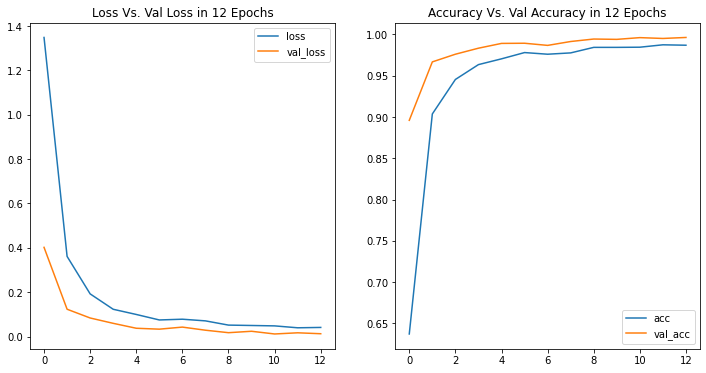

Model đã tốt lên: accuracy trên tập train là 0.9897 trong khi accuracy trên tập test là 0.9866

### Tinh chỉnh thêm đông thời layer và thêm dropout, sử dụng crop_image

sau 20 lần train mô hình đạt được validation accuracy là 0.9903

In [ ]:
# Task 8: Buil a model, which contain these layers:
def create_model():
    '''
    Return: 
        CNN model with 13 layers.
    '''
    
    model = tf.keras.models.Sequential([
        tf.keras.layers.Conv2D(8,(3,3),padding = 'same',activation = 'relu', input_shape = train_data_gen.image_shape,name = 'Layer1'),
        tf.keras.layers.BatchNormalization(momentum=0.95, epsilon=0.005, beta_initializer=tf.keras.initializers.RandomNormal(mean=0.0, stddev=0.05), gamma_initializer=tf.keras.initializers.Constant(value = 0.9)),
        tf.keras.layers.Conv2D(16,(3,3),padding = 'same',activation = 'relu',name = 'Layer2'),
        tf.keras.layers.BatchNormalization(momentum=0.95, epsilon=0.005, beta_initializer=tf.keras.initializers.RandomNormal(mean=0.0, stddev=0.05), gamma_initializer=tf.keras.initializers.Constant(value = 0.9)),
        tf.keras.layers.MaxPooling2D((2,2),name = 'Layer3'),

        tf.keras.layers.Conv2D(32,(3,3),padding = 'same',activation = 'relu',name = 'Layer4'),
        tf.keras.layers.BatchNormalization(momentum=0.95, epsilon=0.005, beta_initializer=tf.keras.initializers.RandomNormal(mean=0.0, stddev=0.05), gamma_initializer=tf.keras.initializers.Constant(value = 0.9)),
        tf.keras.layers.Conv2D(64,(3,3),padding = 'same',activation = 'relu',name ='Layer5'),
        tf.keras.layers.BatchNormalization(momentum=0.95, epsilon=0.005, beta_initializer=tf.keras.initializers.RandomNormal(mean=0.0, stddev=0.05), gamma_initializer=tf.keras.initializers.Constant(value = 0.9)),
        tf.keras.layers.MaxPooling2D((3,3),name = 'Layer6'),

        tf.keras.layers.Conv2D(128,(3,3),padding = 'same',activation = 'relu',name = 'Layer7'),
        tf.keras.layers.BatchNormalization(momentum=0.95, epsilon=0.005, beta_initializer=tf.keras.initializers.RandomNormal(mean=0.0, stddev=0.05), gamma_initializer=tf.keras.initializers.Constant(value = 0.9)),
        tf.keras.layers.Conv2D(256,(3,3),padding = 'same',activation = 'relu',name = 'Layer8'),
        tf.keras.layers.BatchNormalization(momentum=0.95, epsilon=0.005, beta_initializer=tf.keras.initializers.RandomNormal(mean=0.0, stddev=0.05), gamma_initializer=tf.keras.initializers.Constant(value = 0.9)),
        tf.keras.layers.MaxPooling2D((5,5),name = 'Layer9'),

        tf.keras.layers.Flatten(name = 'Layer10'),
        tf.keras.layers.Dense(100,'relu',name = 'Layer11'),
        tf.keras.layers.BatchNormalization(momentum=0.95, epsilon=0.005, beta_initializer=tf.keras.initializers.RandomNormal(mean=0.0, stddev=0.05), gamma_initializer=tf.keras.initializers.Constant(value = 0.9)),
        tf.keras.layers.Dropout(rate = 0.5,name = 'Layer12'),

        tf.keras.layers.Dense(26,'softmax',name = 'Layer13')
    ])
    ## TYPE YOUR CODE for task 8 here:

    return model
model = create_model()

In [ ]:
model.compile('adam','categorical_crossentropy',['accuracy'])
history = model.fit(train_data_gen,validation_data = val_data_gen, epochs = 5,
                             callbacks = [rdlr,mdcp,tsb,es])

Epoch 1/5
1040/1040 [==============================] - ETA: 0s - loss: 1.8339 - accuracy: 0.4733
Epoch 1: saving model to /content/drive/MyDrive/asia_plant_bestmodel.h5
1040/1040 [==============================] - 1108s 1s/step - loss: 1.8339 - accuracy: 0.4733 - val_loss: 1.4634 - val_accuracy: 0.5979 - lr: 0.0010
Epoch 2/5
1040/1040 [==============================] - ETA: 0s - loss: 0.9376 - accuracy: 0.7260
Epoch 2: saving model to /content/drive/MyDrive/asia_plant_bestmodel.h5
1040/1040 [==============================] - 1114s 1s/step - loss: 0.9376 - accuracy: 0.7260 - val_loss: 0.8294 - val_accuracy: 0.7539 - lr: 0.0010
Epoch 3/5
1040/1040 [==============================] - ETA: 0s - loss: 0.6053 - accuracy: 0.8188
Epoch 3: saving model to /content/drive/MyDrive/asia_plant_bestmodel.h5
1040/1040 [==============================] - 1116s 1s/step - loss: 0.6053 - accuracy: 0.8188 - val_loss: 0.3481 - val_accuracy: 0.8954 - lr: 0.0010
Epoch 4/5
1040/1040 [============================

In [ ]:

history = model.fit(train_data_gen,validation_data = val_data_gen, epochs = 5,
                             callbacks = [rdlr,mdcp,tsb,es])

Epoch 1/5
1040/1040 [==============================] - ETA: 0s - loss: 0.2395 - accuracy: 0.9255
Epoch 1: saving model to /content/drive/MyDrive/asia_plant_bestmodel.h5
1040/1040 [==============================] - 1173s 1s/step - loss: 0.2395 - accuracy: 0.9255 - val_loss: 0.1328 - val_accuracy: 0.9599 - lr: 0.0010
Epoch 2/5
1040/1040 [==============================] - ETA: 0s - loss: 0.2064 - accuracy: 0.9379
Epoch 2: saving model to /content/drive/MyDrive/asia_plant_bestmodel.h5
1040/1040 [==============================] - 1181s 1s/step - loss: 0.2064 - accuracy: 0.9379 - val_loss: 0.1351 - val_accuracy: 0.9582 - lr: 0.0010
Epoch 3/5
1040/1040 [==============================] - ETA: 0s - loss: 0.1761 - accuracy: 0.9460
Epoch 3: saving model to /content/drive/MyDrive/asia_plant_bestmodel.h5
1040/1040 [==============================] - 1219s 1s/step - loss: 0.1761 - accuracy: 0.9460 - val_loss: 0.0681 - val_accuracy: 0.9785 - lr: 0.0010
Epoch 4/5
1040/1040 [============================

In [ ]:

history = model.fit(train_data_gen,validation_data = val_data_gen, epochs = 5,
                             callbacks = [rdlr,mdcp,tsb,es])

Epoch 1/5
1040/1040 [==============================] - ETA: 0s - loss: 0.1545 - accuracy: 0.9516
Epoch 1: saving model to /content/drive/MyDrive/asia_plant_bestmodel.h5
1040/1040 [==============================] - 1015s 974ms/step - loss: 0.1545 - accuracy: 0.9516 - val_loss: 0.0644 - val_accuracy: 0.9789 - lr: 0.0010
Epoch 2/5
1040/1040 [==============================] - ETA: 0s - loss: 0.1422 - accuracy: 0.9563
Epoch 2: saving model to /content/drive/MyDrive/asia_plant_bestmodel.h5
1040/1040 [==============================] - 990s 952ms/step - loss: 0.1422 - accuracy: 0.9563 - val_loss: 0.2014 - val_accuracy: 0.9390 - lr: 0.0010
Epoch 3/5
1040/1040 [==============================] - ETA: 0s - loss: 0.1287 - accuracy: 0.9609
Epoch 3: saving model to /content/drive/MyDrive/asia_plant_bestmodel.h5
1040/1040 [==============================] - 982s 944ms/step - loss: 0.1287 - accuracy: 0.9609 - val_loss: 0.0569 - val_accuracy: 0.9816 - lr: 0.0010
Epoch 4/5
1040/1040 [=====================

In [ ]:
history = model.fit(train_data_gen,validation_data = val_data_gen, epochs = 5,
                             callbacks = [rdlr,mdcp,tsb,es])

Epoch 1/5
1040/1040 [==============================] - ETA: 0s - loss: 0.1112 - accuracy: 0.9643
Epoch 1: saving model to /content/drive/MyDrive/asia_plant_bestmodel.h5
1040/1040 [==============================] - 997s 959ms/step - loss: 0.1112 - accuracy: 0.9643 - val_loss: 0.1707 - val_accuracy: 0.9453 - lr: 0.0010
Epoch 2/5
1040/1040 [==============================] - ETA: 0s - loss: 0.1093 - accuracy: 0.9657
Epoch 2: saving model to /content/drive/MyDrive/asia_plant_bestmodel.h5
1040/1040 [==============================] - 993s 955ms/step - loss: 0.1093 - accuracy: 0.9657 - val_loss: 0.0416 - val_accuracy: 0.9875 - lr: 0.0010
Epoch 3/5
1040/1040 [==============================] - ETA: 0s - loss: 0.0964 - accuracy: 0.9703
Epoch 3: saving model to /content/drive/MyDrive/asia_plant_bestmodel.h5
1040/1040 [==============================] - 990s 952ms/step - loss: 0.0964 - accuracy: 0.9703 - val_loss: 0.1317 - val_accuracy: 0.9615 - lr: 0.0010
Epoch 4/5
1040/1040 [======================

In [ ]:
history = model.fit(train_data_gen,validation_data = val_data_gen, epochs = 5,
                             callbacks = [rdlr,mdcp,tsb,es])

Epoch 1/5
1040/1040 [==============================] - ETA: 0s - loss: 0.0873 - accuracy: 0.9722
Epoch 1: val_accuracy improved from -inf to 0.97804, saving model to /content/drive/MyDrive/asia_plant_bestmodel.h5
1040/1040 [==============================] - 1004s 963ms/step - loss: 0.0873 - accuracy: 0.9722 - val_loss: 0.0668 - val_accuracy: 0.9780 - lr: 0.0010
Epoch 2/5
1040/1040 [==============================] - ETA: 0s - loss: 0.0864 - accuracy: 0.9728
Epoch 2: val_accuracy improved from 0.97804 to 0.99028, saving model to /content/drive/MyDrive/asia_plant_bestmodel.h5
1040/1040 [==============================] - 982s 944ms/step - loss: 0.0864 - accuracy: 0.9728 - val_loss: 0.0354 - val_accuracy: 0.9903 - lr: 0.0010
Epoch 3/5
1040/1040 [==============================] - ETA: 0s - loss: 0.0793 - accuracy: 0.9747
Epoch 3: val_accuracy did not improve from 0.99028
1040/1040 [==============================] - 976s 939ms/step - loss: 0.0793 - accuracy: 0.9747 - val_loss: 0.1301 - val_ac

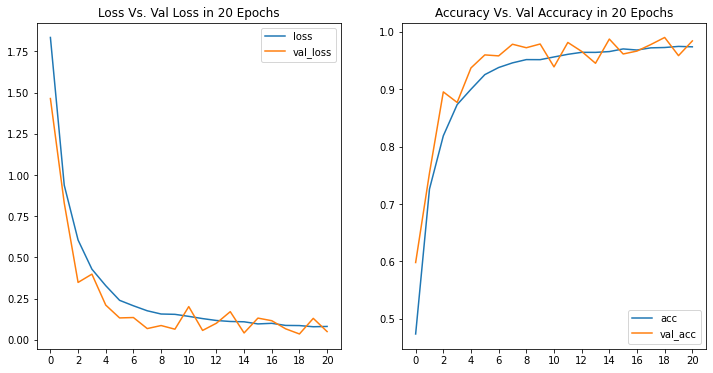

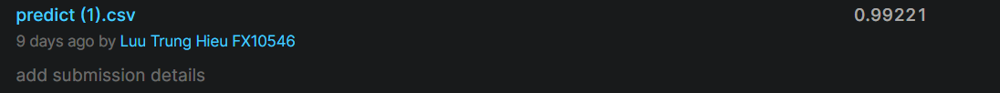

accuracy trên tập val đã tăng lên 0.9903 và trên tập test là 0.99221. Model đã hoạt động tốt hơn 2.4% so với model ban đầu

### tiếp tục sử dụng model trên nhưng train cho dữ liệu không crop 

In [ ]:

model2 = create_model()
model2.compile('adam','categorical_crossentropy',['accuracy'])

#callbacks
import datetime
logdir = os.path.join('logs2', datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
tsb=tf.keras.callbacks.TensorBoard(log_dir=logdir,histogram_freq=1)
mdcp = tf.keras.callbacks.ModelCheckpoint('/content/drive/MyDrive/asia_plant_nocrop.h5',verbose = 1,monitor = 'val_accuracy',save_best_only=True)
rdlr = tf.keras.callbacks.ReduceLROnPlateau(monitor ='val_accuracy', patience = 3)
es = tf.keras.callbacks.EarlyStopping(monitor='val_accuracy', min_delta=0.05,patience=3)


history = model2.fit(train_data_gen_nocrop,validation_data = val_data_gen_nocrop, epochs = 10,
                             callbacks = [rdlr,mdcp,tsb,es])

Found 33274 images belonging to 26 classes.
Found 8333 images belonging to 26 classes.
Epoch 1/10
1040/1040 [==============================] - ETA: 0s - loss: 1.3487 - accuracy: 0.6371
Epoch 1: val_accuracy improved from -inf to 0.89596, saving model to /content/drive/MyDrive/asia_plant_nocrop.h5
1040/1040 [==============================] - 1134s 1s/step - loss: 1.3487 - accuracy: 0.6371 - val_loss: 0.4021 - val_accuracy: 0.8960 - lr: 0.0010
Epoch 2/10
1040/1040 [==============================] - ETA: 0s - loss: 0.3612 - accuracy: 0.9037
Epoch 2: val_accuracy improved from 0.89596 to 0.96676, saving model to /content/drive/MyDrive/asia_plant_nocrop.h5
1040/1040 [==============================] - 1070s 1s/step - loss: 0.3612 - accuracy: 0.9037 - val_loss: 0.1230 - val_accuracy: 0.9668 - lr: 0.0010
Epoch 3/10
1040/1040 [==============================] - ETA: 0s - loss: 0.1922 - accuracy: 0.9455
Epoch 3: val_accuracy improved from 0.96676 to 0.97612, saving model to /content/drive/MyDrive

In [ ]:
history = model2.fit(train_data_gen_nocrop,validation_data = val_data_gen_nocrop, epochs = 10,
                             callbacks = [rdlr,mdcp,tsb,es])

Epoch 1/10
1040/1040 [==============================] - ETA: 0s - loss: 0.0746 - accuracy: 0.9781
Epoch 1: val_accuracy improved from 0.98920 to 0.98944, saving model to /content/drive/MyDrive/asia_plant_nocrop.h5
1040/1040 [==============================] - 1044s 1s/step - loss: 0.0746 - accuracy: 0.9781 - val_loss: 0.0331 - val_accuracy: 0.9894 - lr: 0.0010
Epoch 2/10
1040/1040 [==============================] - ETA: 0s - loss: 0.0780 - accuracy: 0.9761
Epoch 2: val_accuracy did not improve from 0.98944
1040/1040 [==============================] - 1013s 974ms/step - loss: 0.0780 - accuracy: 0.9761 - val_loss: 0.0424 - val_accuracy: 0.9868 - lr: 0.0010
Epoch 3/10
1040/1040 [==============================] - ETA: 0s - loss: 0.0705 - accuracy: 0.9777
Epoch 3: val_accuracy improved from 0.98944 to 0.99148, saving model to /content/drive/MyDrive/asia_plant_nocrop.h5
1040/1040 [==============================] - 1020s 981ms/step - loss: 0.0705 - accuracy: 0.9777 - val_loss: 0.0284 - val_acc

In [ ]:
history = model2.fit(train_data_gen_nocrop,validation_data = val_data_gen_nocrop, epochs = 10,
                             callbacks = [rdlr,mdcp,tsb,es])

Epoch 1/10
1040/1040 [==============================] - ETA: 0s - loss: 0.0497 - accuracy: 0.9844
Epoch 1: val_accuracy improved from -inf to 0.99412, saving model to /content/drive/MyDrive/asia_plant_nocrop.h5
1040/1040 [==============================] - 1053s 1s/step - loss: 0.0497 - accuracy: 0.9844 - val_loss: 0.0236 - val_accuracy: 0.9941 - lr: 0.0010
Epoch 2/10
1040/1040 [==============================] - ETA: 0s - loss: 0.0479 - accuracy: 0.9846
Epoch 2: val_accuracy improved from 0.99412 to 0.99616, saving model to /content/drive/MyDrive/asia_plant_nocrop.h5
1040/1040 [==============================] - 1047s 1s/step - loss: 0.0479 - accuracy: 0.9846 - val_loss: 0.0114 - val_accuracy: 0.9962 - lr: 0.0010
Epoch 3/10
1040/1040 [==============================] - ETA: 0s - loss: 0.0393 - accuracy: 0.9875
Epoch 3: val_accuracy did not improve from 0.99616
1040/1040 [==============================] - 1005s 966ms/step - loss: 0.0393 - accuracy: 0.9875 - val_loss: 0.0167 - val_accuracy:

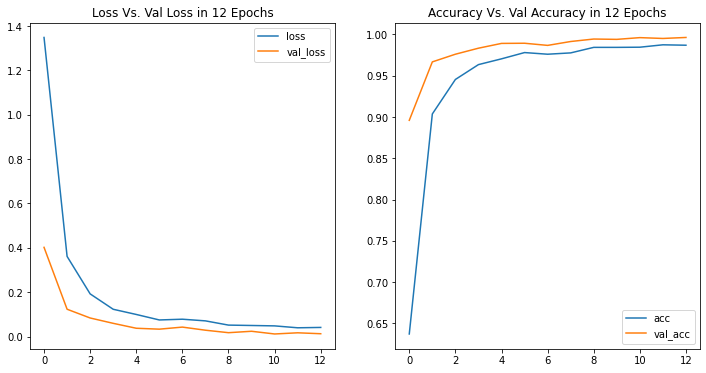

accuracy của tập validation đạt được 0.9964 sau 12 epochs

In [ ]:
# thực hiện dự đoán trên tập test và submit kết quả lên kaggle

# load best model từ file đã lưu bằng model checkpoint
best_model = tf.keras.models.load_model('/content/drive/MyDrive/asia_plant_nocrop.h5')

# tiền xử lý dữ liệu test
test_generator = tf.keras.preprocessing.image.ImageDataGenerator(rescale = 1./255)
test_data_gen = test_generator.flow_from_directory(directory='/content/bali-26_test', target_size= (128,128),shuffle=False)

# sử dụng model đã train để dự đoán
pred = best_model.predict(test_data_gen)
pred = pred.argmax(axis=1)

# ghi kết qua theo đúng format ra file csv
with open('predict.csv','w') as f:
  f.write(f'id,category\n')
  for name,clas in zip(test_data_gen.filenames,pred):
    a = name.split('/')[1]
    f.write(f'{a},{classes[clas]}\n')

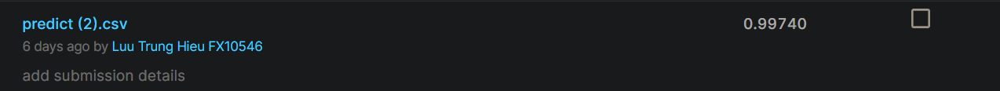

kết quả đạt được trên kaggle là 0.99740 của accuracy. Như vậy model đã cải thiện 2.9% so với model ban đầu

### pretrain với mạng efficientnet b0

In [ ]:
function ClickConnect(){
    console.log("Clicked on connect button"); 
    document.querySelector("colab-connect-button").click()
}
setInterval(ClickConnect,60000)

In [ ]:
efnb0 = tf.keras.applications.efficientnet.EfficientNetB0(weights='imagenet', include_top=False, input_shape=train_data_gen.image_shape, classes=26)

model =  tf.keras.Sequential()
model.add(efnb0)
model.add(tf.keras.layers.GlobalAveragePooling2D())
model.add(tf.keras.layers.Dropout(0.7))
model.add(tf.keras.layers.Dense(26, activation='softmax'))

model.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 efficientnetb0 (Functional)  (None, 4, 4, 1280)       4049571   
                                                                 
 global_average_pooling2d_2   (None, 1280)             0         
 (GlobalAveragePooling2D)                                        
                                                                 
 dropout_4 (Dropout)         (None, 1280)              0         
                                                                 
 dense_5 (Dense)             (None, 26)                33306     
                                                                 
Total params: 4,082,877
Trainable params: 4,040,854
Non-trainable params: 42,023
_________________________________________________________________


In [ ]:
model.compile('adam','categorical_crossentropy',['accuracy'])

#callbacks
import datetime
logdir = os.path.join('logs2', datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
tsb=tf.keras.callbacks.TensorBoard(log_dir=logdir,histogram_freq=1)
mdcp = tf.keras.callbacks.ModelCheckpoint('/content/drive/MyDrive/asia_plant_b0_efficientnet.h5',verbose = 1,monitor = 'val_accuracy',save_best_only=True)
rdlr = tf.keras.callbacks.ReduceLROnPlateau(monitor ='val_accuracy', patience = 3)
es = tf.keras.callbacks.EarlyStopping(monitor='val_accuracy', min_delta=0.05,patience=3)


history = model.fit(train_data_gen_nocrop,validation_data = val_data_gen_nocrop, epochs = 10,
                             callbacks = [rdlr,mdcp,tsb,es],batch_size = 16)

Epoch 1/10
1040/1040 [==============================] - ETA: 0s - loss: 0.4427 - accuracy: 0.8740
Epoch 1: val_accuracy improved from -inf to 0.04128, saving model to /content/drive/MyDrive/asia_plant_b0_efficientnet.h5
1040/1040 [==============================] - 987s 941ms/step - loss: 0.4427 - accuracy: 0.8740 - val_loss: 18.3107 - val_accuracy: 0.0413 - lr: 0.0010
Epoch 2/10
1040/1040 [==============================] - ETA: 0s - loss: 0.1040 - accuracy: 0.9695
Epoch 2: val_accuracy improved from 0.04128 to 0.05964, saving model to /content/drive/MyDrive/asia_plant_b0_efficientnet.h5
1040/1040 [==============================] - 974s 936ms/step - loss: 0.1040 - accuracy: 0.9695 - val_loss: 9.7551 - val_accuracy: 0.0596 - lr: 0.0010
Epoch 3/10
 653/1040 [=================>............] - ETA: 4:53 - loss: 0.0772 - accuracy: 0.9770

KeyboardInterrupt: ignored

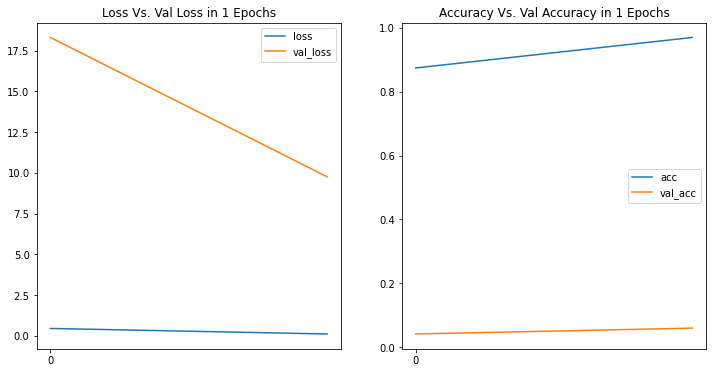

Mạng Efficient B0 không hiệu quả khi accuracy trên tập train đạt được 0.97, tuy nhiên trên tập val chỉ được 0.05 , chạy trên nhiều epochs nhưng không cải thiện được

In [ ]:
#  chỉ lấy 1 phần mạng efficientB0
for layer in ['block1a_project_conv','block4a_expand_bn','block5c_add','block6d_add']:
  base_model = tf.keras.applications.efficientnet.EfficientNetB0(include_top=False,
      weights='imagenet', 
      input_shape=train_data_gen.image_shape, pooling = 'max')
  x = base_model.get_layer(layer).output
  x = tf.keras.layers.GlobalAveragePooling2D()(x)
  x = tf.keras.layers.BatchNormalization()(x)
  x= tf.keras.layers.Dense(512,'relu')(x)
  x = tf.keras.layers.Dropout(0.5)(x)
  x = tf.keras.layers.Dense(256,'relu')(x)
  x = tf.keras.layers.Dropout(0.5)(x)
  output = tf.keras.layers.Dense(26,'softmax')(x)
  model = tf.keras.models.Model(inputs = base_model.input, outputs = output)

  logdir = os.path.join('logs2', datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  tsb=tf.keras.callbacks.TensorBoard(log_dir=logdir,histogram_freq=1)
  mdcp = tf.keras.callbacks.ModelCheckpoint('/content/drive/MyDrive/asia_plant_baseline.h5',verbose = 1,monitor = 'val_accuracy',save_best_only=True)
  rdlr = tf.keras.callbacks.ReduceLROnPlateau(monitor ='val_accuracy', patience = 3)

  model.compile('adam','categorical_crossentropy',['accuracy'])
  history = model.fit(train_data_gen,validation_data = val_data_gen, epochs = 1,
                              callbacks = [rdlr,mdcp,tsb])
  print(layer)
  print(history.history)

1040/1040 [==============================] - ETA: 0s - loss: 2.2160 - accuracy: 0.3175
Epoch 1: val_accuracy improved from -inf to 0.04704, saving model to /content/drive/MyDrive/asia_plant_baseline.h5
1040/1040 [==============================] - 990s 951ms/step - loss: 2.2160 - accuracy: 0.3175 - val_loss: 227.5363 - val_accuracy: 0.0470 - lr: 0.0010
block1a_project_conv
{'loss': [2.2160444259643555], 'accuracy': [0.31745508313179016], 'val_loss': [227.53628540039062], 'val_accuracy': [0.0470418818295002], 'lr': [0.001]}
1040/1040 [==============================] - ETA: 0s - loss: 1.3717 - accuracy: 0.5988
Epoch 1: val_accuracy improved from -inf to 0.04128, saving model to /content/drive/MyDrive/asia_plant_baseline.h5
1040/1040 [==============================] - 1010s 969ms/step - loss: 1.3717 - accuracy: 0.5988 - val_loss: 59.2374 - val_accuracy: 0.0413 - lr: 0.0010
block4a_expand_bn
{'loss': [1.3716864585876465], 'accuracy': [0.5987557768821716], 'val_loss': [59.23740005493164], 'v

Val accuracy không được cải thiện

### pretrain với mạng resnet

In [ ]:
# load resnet
rn = tf.keras.applications.resnet.ResNet50(weights='imagenet', include_top=False, input_shape=train_data_gen.image_shape, classes=26)

# xây dựng model
model =  tf.keras.Sequential()
model.add(rn)
model.add(tf.keras.layers.GlobalAveragePooling2D())
model.add(tf.keras.layers.Dropout(0.5))
model.add(tf.keras.layers.Dense(26, activation='softmax'))

model.summary()

Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 resnet50 (Functional)       (None, 4, 4, 2048)        23587712  
                                                                 
 global_average_pooling2d_4   (None, 2048)             0         
 (GlobalAveragePooling2D)                                        
                                                                 
 dropout_6 (Dropout)         (None, 2048)              0         
                                                                 
 dense_7 (Dense)             (None, 26)                53274     
                                                                 
Total params: 23,640,986
Trainable params: 23,587,866
Non-trainable params: 53,120
_________________________________________________________________


In [ ]:
# complie model
model.compile('adam','categorical_crossentropy',['accuracy'])

#callbacks
import datetime
logdir = os.path.join('logs2', datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
tsb=tf.keras.callbacks.TensorBoard(log_dir=logdir,histogram_freq=1)
mdcp = tf.keras.callbacks.ModelCheckpoint('/content/drive/MyDrive/asia_plant_resnet50.h5',verbose = 1,monitor = 'val_accuracy',save_best_only=True)
rdlr = tf.keras.callbacks.ReduceLROnPlateau(monitor ='val_accuracy', patience = 3)
es = tf.keras.callbacks.EarlyStopping(monitor='val_accuracy', min_delta=0.05,patience=3)

# train model
history = model.fit(train_data_gen_nocrop,validation_data = val_data_gen_nocrop, epochs = 10,
                             callbacks = [rdlr,mdcp,tsb,es],batch_size = 16)

Epoch 1/10
1040/1040 [==============================] - ETA: 0s - loss: 0.6033 - accuracy: 0.8341
Epoch 1: val_accuracy improved from -inf to 0.42962, saving model to /content/drive/MyDrive/asia_plant_resnet50.h5
1040/1040 [==============================] - 962s 919ms/step - loss: 0.6033 - accuracy: 0.8341 - val_loss: 3.0892 - val_accuracy: 0.4296 - lr: 0.0010
Epoch 2/10
1040/1040 [==============================] - ETA: 0s - loss: 0.1499 - accuracy: 0.9560
Epoch 2: val_accuracy improved from 0.42962 to 0.89548, saving model to /content/drive/MyDrive/asia_plant_resnet50.h5
1040/1040 [==============================] - 924s 889ms/step - loss: 0.1499 - accuracy: 0.9560 - val_loss: 0.4375 - val_accuracy: 0.8955 - lr: 0.0010
Epoch 3/10
1040/1040 [==============================] - ETA: 0s - loss: 0.1059 - accuracy: 0.9675
Epoch 3: val_accuracy did not improve from 0.89548
1040/1040 [==============================] - 896s 862ms/step - loss: 0.1059 - accuracy: 0.9675 - val_loss: 4.9590 - val_ac

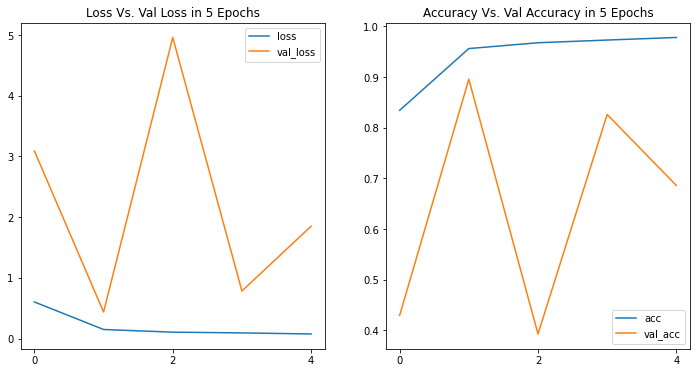

Mạng resnet50 cũng không tốt khi tập train kết quả tốt dần, còn kết quả tập val thì kém và không ổn định

Chỉ lấy 38 layer đầu tiên của mạng resnet để kiểm tra

94781440/94765736 [==============================] - 1s 0us/step


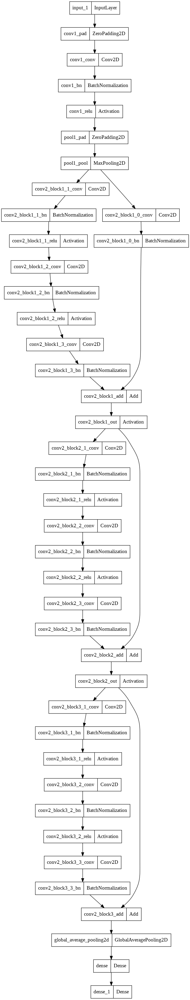

In [ ]:
import tensorflow as tf
# loađ resnet
rn = tf.keras.applications.resnet.ResNet50(weights='imagenet', include_top=False, input_shape=train_data_gen.image_shape, classes=26)
# lấy đến layer thứ 38
gpooling = tf.keras.layers.GlobalAveragePooling2D()(rn.layers[37].output) 
dense1 = tf.keras.layers.Dense(64, activation='softmax')(gpooling)
output = tf.keras.layers.Dense(26, activation='softmax')(dense1)
model = tf.keras.models.Model(inputs = rn.input, outputs = output)
tf.keras.utils.plot_model(model)

In [ ]:
model.compile('adam','categorical_crossentropy',['accuracy'])

#callbacks
import datetime
logdir = os.path.join('logs2', datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
tsb=tf.keras.callbacks.TensorBoard(log_dir=logdir,histogram_freq=1)
mdcp = tf.keras.callbacks.ModelCheckpoint('/content/drive/MyDrive/asia_plant_resnet50.h5',verbose = 1,monitor = 'val_accuracy',save_best_only=True)
rdlr = tf.keras.callbacks.ReduceLROnPlateau(monitor ='val_accuracy', patience = 3)
es = tf.keras.callbacks.EarlyStopping(monitor='val_accuracy', min_delta=0.05,patience=3)

# train model
history = model.fit(train_data_gen_nocrop,validation_data = val_data_gen_nocrop, epochs = 10,
                             callbacks = [rdlr,mdcp,tsb,es],batch_size = 16)

Epoch 1/10
1040/1040 [==============================] - ETA: 0s - loss: 2.9079 - accuracy: 0.1978
Epoch 1: val_accuracy improved from -inf to 0.16993, saving model to /content/drive/MyDrive/asia_plant_resnet50.h5
1040/1040 [==============================] - 929s 892ms/step - loss: 2.9079 - accuracy: 0.1978 - val_loss: 2.8719 - val_accuracy: 0.1699 - lr: 0.0010
Epoch 2/10
1040/1040 [==============================] - ETA: 0s - loss: 2.4448 - accuracy: 0.2761
Epoch 2: val_accuracy improved from 0.16993 to 0.22669, saving model to /content/drive/MyDrive/asia_plant_resnet50.h5
1040/1040 [==============================] - 928s 892ms/step - loss: 2.4448 - accuracy: 0.2761 - val_loss: 2.5363 - val_accuracy: 0.2267 - lr: 0.0010
Epoch 3/10
1040/1040 [==============================] - ETA: 0s - loss: 2.1293 - accuracy: 0.3025
Epoch 3: val_accuracy improved from 0.22669 to 0.28489, saving model to /content/drive/MyDrive/asia_plant_resnet50.h5
1040/1040 [==============================] - 933s 898ms

KeyboardInterrupt: ignored

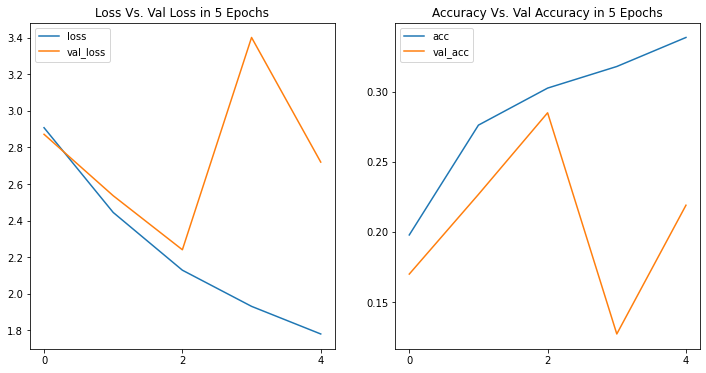

Perform của mođel không được tốt

### pretrain với vgg16

In [ ]:
basemodel = tf.keras.applications.VGG16(include_top = False, input_shape = train_data_gen.image_shape)

basemodel.trainable = True
flatten = tf.keras.layers.Flatten()(basemodel.output)
dense = tf.keras.layers.Dense(512,'relu')(flatten)
output = tf.keras.layers.Dense(26,'softmax')(dense)
model = tf.keras.models.Model(inputs = basemodel.input,outputs = output)

In [ ]:
history = model.fit(train_data_gen,validation_data = val_data_gen,epochs = 5, 
          callbacks = [rdlr,mdcp,tsb])

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  


Epoch 1/5
1041/1041 [==============================] - ETA: 0s - loss: 1.2989 - accuracy: 0.6336
Epoch 1: saving model to /content/gdrive/MyDrive/asia_plant_bestmodel.h5
1041/1041 [==============================] - 980s 929ms/step - loss: 1.2989 - accuracy: 0.6336 - val_loss: 3.3872 - val_accuracy: 0.2834 - lr: 0.0010
Epoch 2/5
1041/1041 [==============================] - ETA: 0s - loss: 0.1362 - accuracy: 0.9650
Epoch 2: saving model to /content/gdrive/MyDrive/asia_plant_bestmodel.h5
1041/1041 [==============================] - 949s 911ms/step - loss: 0.1362 - accuracy: 0.9650 - val_loss: 3.9990 - val_accuracy: 0.3074 - lr: 0.0010
Epoch 3/5
1041/1041 [==============================] - ETA: 0s - loss: 0.0143 - accuracy: 0.9976
Epoch 3: saving model to /content/gdrive/MyDrive/asia_plant_bestmodel.h5
1041/1041 [==============================] - 966s 928ms/step - loss: 0.0143 - accuracy: 0.9976 - val_loss: 4.8392 - val_accuracy: 0.3055 - lr: 0.0010
Epoch 4/5
1041/1041 [===================

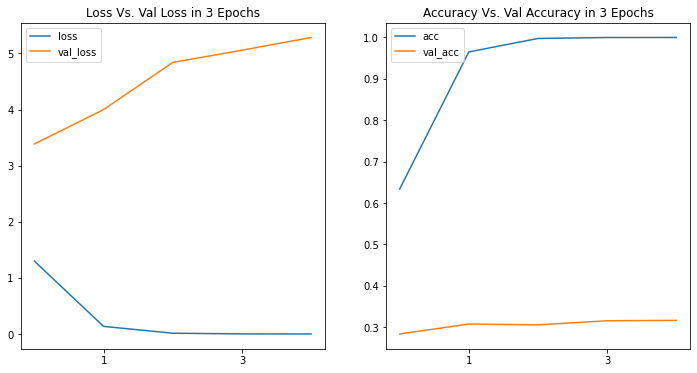

model vgg16 cũng perform không tốt

### data agumentation với mixup

In [ ]:
# tạo class mixup image data generator
class MixupImageDataGenerator():
    def __init__(self, generator, directory, batch_size, img_height, img_width, alpha=0.2, subset=None):
        """Constructor for mixup image data generator.

        Arguments:
            generator {object} -- là tf.Keras ImageDataGenerator.
            directory {str} -- đường dẫn thư mục của file train
            batch_size {int} -- Batch size.
            img_height {int} -- kích thước pixel
            img_width {int} -- kích thước pixel

        Keyword Arguments:
            alpha {float} -- Mixup beta distribution alpha parameter. (default: {0.2})
            subset {str} -- 'training' or 'validation' if validation_split is specified in
            `generator` (ImageDataGenerator).(default: {None})
        """

        self.batch_index = 0
        self.batch_size = batch_size
        self.alpha = alpha

        # First iterator yielding tuples of (x, y)
        self.generator1 = generator.flow_from_directory(directory,
                                                        target_size=(
                                                            img_height, img_width),
                                                        class_mode="categorical",
                                                        batch_size=batch_size,
                                                        shuffle=True,
                                                        subset=subset)

        # Second iterator yielding tuples of (x, y)
        self.generator2 = generator.flow_from_directory(directory,
                                                        target_size=(
                                                            img_height, img_width),
                                                        class_mode="categorical",
                                                        batch_size=batch_size,
                                                        shuffle=True,
                                                        subset=subset)

        # Number of images across all classes in image directory.
        self.n = self.generator1.samples

    def reset_index(self):
        """Reset the generator indexes array.
        """

        self.generator1._set_index_array()
        self.generator2._set_index_array()

    def on_epoch_end(self):
        self.reset_index()

    def reset(self):
        self.batch_index = 0

    def __len__(self):
        # round up
        return (self.n + self.batch_size - 1) // self.batch_size

    def get_steps_per_epoch(self):
        """Get number of steps per epoch based on batch size and
        number of images.

        Returns:
            int -- steps per epoch.
        """

        return self.n // self.batch_size

    def __next__(self):
        """Get next batch input/output pair.

        Returns:
            tuple -- batch of input/output pair, (inputs, outputs).
        """

        if self.batch_index == 0:
            self.reset_index()

        current_index = (self.batch_index * self.batch_size) % self.n
        if self.n > current_index + self.batch_size:
            self.batch_index += 1
        else:
            self.batch_index = 0


        # random sample the lambda value from beta distribution.
        X1, y1 = self.generator1.next()
        X2, y2 = self.generator2.next()

        l = np.random.beta(self.alpha, self.alpha, X1.shape[0])

        X_l = l.reshape(X1.shape[0], 1, 1, 1)
        y_l = l.reshape(X1.shape[0], 1)

        # Perform the mixup.
        X = X1 * X_l + X2 * (1 - X_l)
        y = y1 * y_l + y2 * (1 - y_l)
        return X, y

    def __iter__(self):
        while True:
            yield next(self)

In [ ]:
# cài đặt tham số
batch_size = 16
validation_split = 0.3
img_height = 128
img_width = 128
epochs = 10

# tạo train và val generator
input_imgen = tf.keras.preprocessing.image.ImageDataGenerator(
    rescale=1./255,
    rotation_range=5,
    width_shift_range=0.05,
    height_shift_range=0,
    shear_range=0.05,
    zoom_range=0,
    brightness_range=(1, 1.3),
    horizontal_flip=True,
    fill_mode='nearest'
    )

train_generator = MixupImageDataGenerator(generator=input_imgen,
                                          directory='/content/bali-26_train/train_val/train',
                                          batch_size=batch_size,
                                          img_height=img_height,
                                          img_width=img_height,
                                          alpha=0.4)

validation_generator = input_imgen.flow_from_directory('/content/bali-26_train/train_val/val',target_size=(img_height,img_width),batch_size = batch_size)


print('training steps: ', train_generator.get_steps_per_epoch())
print('validation steps: ', validation_generator.samples // batch_size)


Found 33274 images belonging to 26 classes.
Found 33274 images belonging to 26 classes.
Found 8333 images belonging to 26 classes.
training steps:  2079
validation steps:  520


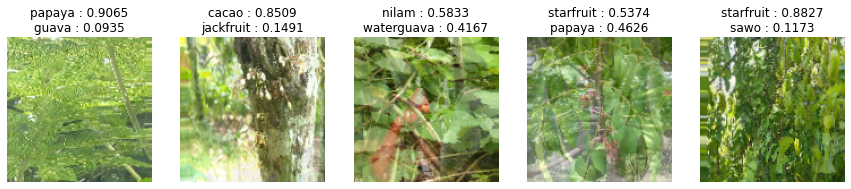

In [ ]:
# hiển thị 1 số bức ảnh sau khi đã áp dụng mixup
sample_x, sample_y = next(train_generator)
fig, ax = plt.subplots(1,5,figsize = (15,3))
for i,axi in enumerate(ax.flatten()):
    axi.imshow(sample_x[i])
    axi.axis('off')
    first_max = np.argmax(sample_y[i])
    second_max = np.argsort(sample_y[i])[-2]
    axi.set_title(f'{classes[first_max]} : {round(sample_y[i][first_max],4)}\n{classes[second_max]} : {round(sample_y[i][second_max],4)}')

In [ ]:
# Task 8: Buil a model, which contain these layers:
def create_model():
    '''
    Return: 
        CNN model with 13 layers.
    '''
    
    model = tf.keras.models.Sequential([
        tf.keras.layers.Conv2D(8,(3,3),padding = 'same',activation = 'relu', input_shape = train_data_gen.image_shape,name = 'Layer1'),
        tf.keras.layers.BatchNormalization(momentum=0.95, epsilon=0.005, beta_initializer=tf.keras.initializers.RandomNormal(mean=0.0, stddev=0.05), gamma_initializer=tf.keras.initializers.Constant(value = 0.9)),
        tf.keras.layers.Conv2D(16,(3,3),padding = 'same',activation = 'relu',name = 'Layer2'),
        tf.keras.layers.BatchNormalization(momentum=0.95, epsilon=0.005, beta_initializer=tf.keras.initializers.RandomNormal(mean=0.0, stddev=0.05), gamma_initializer=tf.keras.initializers.Constant(value = 0.9)),
        tf.keras.layers.MaxPooling2D((2,2),name = 'Layer3'),

        tf.keras.layers.Conv2D(32,(3,3),padding = 'same',activation = 'relu',name = 'Layer4'),
        tf.keras.layers.BatchNormalization(momentum=0.95, epsilon=0.005, beta_initializer=tf.keras.initializers.RandomNormal(mean=0.0, stddev=0.05), gamma_initializer=tf.keras.initializers.Constant(value = 0.9)),
        tf.keras.layers.Conv2D(64,(3,3),padding = 'same',activation = 'relu',name ='Layer5'),
        tf.keras.layers.BatchNormalization(momentum=0.95, epsilon=0.005, beta_initializer=tf.keras.initializers.RandomNormal(mean=0.0, stddev=0.05), gamma_initializer=tf.keras.initializers.Constant(value = 0.9)),
        tf.keras.layers.MaxPooling2D((3,3),name = 'Layer6'),

        tf.keras.layers.Flatten(name = 'Layer10'),
        tf.keras.layers.Dense(100,'relu',name = 'Layer11'),
        tf.keras.layers.BatchNormalization(momentum=0.95, epsilon=0.005, beta_initializer=tf.keras.initializers.RandomNormal(mean=0.0, stddev=0.05), gamma_initializer=tf.keras.initializers.Constant(value = 0.9)),
        tf.keras.layers.Dropout(rate = 0.5,name = 'Layer12'),

        tf.keras.layers.Dense(26,'softmax',name = 'Layer13')
    ])
    ## TYPE YOUR CODE for task 8 here:

    return model
model = create_model()

In [ ]:

import datetime
model.compile('adam','categorical_crossentropy',['accuracy'])

logdir = os.path.join('logs2', datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
tsb=tf.keras.callbacks.TensorBoard(log_dir=logdir,histogram_freq=1)
mdcp = tf.keras.callbacks.ModelCheckpoint('/content/drive/MyDrive/asia_plant_mixup.h5',verbose = 1,monitor = 'val_accuracy',save_best_only=True)
rdlr = tf.keras.callbacks.ReduceLROnPlateau(monitor ='val_accuracy', patience = 3)
# es = tf.keras.callbacks.EarlyStopping(monitor='val_accuracy', min_delta=0.01,patience=3)

history = model.fit(train_generator,validation_data = validation_generator,
                    steps_per_epoch=train_generator.get_steps_per_epoch(),validation_steps=validation_generator.samples // batch_size,epochs=epochs,callbacks = [rdlr,mdcp,tsb])

Epoch 1/10
2079/2079 [==============================] - ETA: 0s - loss: 2.2410 - accuracy: 0.4290
Epoch 1: val_accuracy improved from -inf to 0.70120, saving model to /content/drive/MyDrive/asia_plant_mixup.h5
2079/2079 [==============================] - 1915s 915ms/step - loss: 2.2410 - accuracy: 0.4290 - val_loss: 1.0998 - val_accuracy: 0.7012 - lr: 0.0010
Epoch 2/10
2079/2079 [==============================] - ETA: 0s - loss: 1.7202 - accuracy: 0.6219
Epoch 2: val_accuracy improved from 0.70120 to 0.80156, saving model to /content/drive/MyDrive/asia_plant_mixup.h5
2079/2079 [==============================] - 1990s 958ms/step - loss: 1.7202 - accuracy: 0.6219 - val_loss: 0.7736 - val_accuracy: 0.8016 - lr: 0.0010
Epoch 3/10
2079/2079 [==============================] - ETA: 0s - loss: 1.5392 - accuracy: 0.6947
Epoch 3: val_accuracy improved from 0.80156 to 0.87332, saving model to /content/drive/MyDrive/asia_plant_mixup.h5
2079/2079 [==============================] - 2104s 1s/step - l

Epoch 1/10
2079/2079 [==============================] - ETA: 0s - loss: 1.2798 - accuracy: 0.7975
Epoch 1: val_accuracy improved from -inf to 0.92849, saving model to /content/drive/MyDrive/asia_plant_mixup.h5
2079/2079 [==============================] - 2034s 977ms/step - loss: 1.2798 - accuracy: 0.7975 - val_loss: 0.3340 - val_accuracy: 0.9285 - lr: 0.0010
Epoch 2/10
2079/2079 [==============================] - ETA: 0s - loss: 1.2405 - accuracy: 0.8133
Epoch 2: val_accuracy improved from 0.92849 to 0.94219, saving model to /content/drive/MyDrive/asia_plant_mixup.h5
2079/2079 [==============================] - 2400s 1s/step - loss: 1.2405 - accuracy: 0.8133 - val_loss: 0.2868 - val_accuracy: 0.9422 - lr: 0.0010
Epoch 3/10
 931/2079 [============>.................] - ETA: 19:24 - loss: 1.2161 - accuracy: 0.8244

KeyboardInterrupt: ignored

Epoch 1/10
2079/2079 [==============================] - ETA: 0s - loss: 1.2230 - accuracy: 0.8205
Epoch 1: val_accuracy improved from -inf to 0.95036, saving model to /content/drive/MyDrive/asia_plant_mixup.h5
2079/2079 [==============================] - 1930s 928ms/step - loss: 1.2230 - accuracy: 0.8205 - val_loss: 0.2594 - val_accuracy: 0.9504 - lr: 0.0010
Epoch 2/10
2079/2079 [==============================] - ETA: 0s - loss: 1.1889 - accuracy: 0.8319
Epoch 2: val_accuracy improved from 0.95036 to 0.96118, saving model to /content/drive/MyDrive/asia_plant_mixup.h5
2079/2079 [==============================] - 1808s 870ms/step - loss: 1.1889 - accuracy: 0.8319 - val_loss: 0.2181 - val_accuracy: 0.9612 - lr: 0.0010
Epoch 3/10
2079/2079 [==============================] - ETA: 0s - loss: 1.1775 - accuracy: 0.8393
Epoch 3: val_accuracy improved from 0.96118 to 0.96142, saving model to /content/drive/MyDrive/asia_plant_mixup.h5
2079/2079 [==============================] - 1806s 869ms/step 

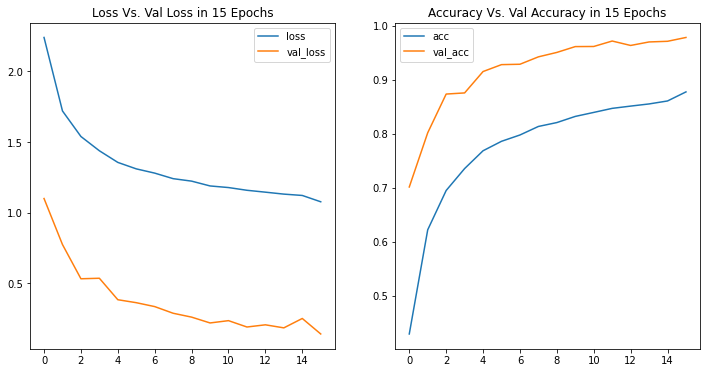

Nhận xét: khi sử dụng mixup thì loss và accuracy trên tập val đều tốt hơn trên tập train, tuy nhiên model lâu hội tụ, và kết quả đạt được sau 15 lần train là val_accuracy đạt được là 0.9781 vẫn thấp hơn so với dữ liệu không sử dụng agumentation

### data agumentation với cutmix

In [ ]:
# cài đặt thư viện cutmix
!pip install cutmix-keras
from cutmix_keras import CutMixImageDataGenerator  # Import CutMix

# xác định size và batchsize
IMG_SIZE = 128
BATCH_SIZE = 16

# tạo train và val datagenerator
train_datagen = tf.keras.preprocessing.image.ImageDataGenerator(
    rescale=1./255, rotation_range=5,
    width_shift_range=0.05,
    height_shift_range=0,
    shear_range=0.05,
    zoom_range=0,
    brightness_range=(1, 1.3),
    horizontal_flip=True,
    fill_mode='nearest'
)

train_generator1 = train_datagen.flow_from_directory(
    '/content/bali-26_train/train_val/train',
    target_size=(IMG_SIZE, IMG_SIZE),
    color_mode='rgb',
    class_mode='categorical',
    batch_size=BATCH_SIZE,
    shuffle=True,  # Required
)

train_generator2 = train_datagen.flow_from_directory(
    '/content/bali-26_train/train_val/train',
    target_size=(IMG_SIZE, IMG_SIZE),
    color_mode='rgb',
    class_mode='categorical',
    batch_size=BATCH_SIZE,
    shuffle=True,  # Required
)

# sử dụng CutMixImageDataGenerator cho tập train
train_generator = CutMixImageDataGenerator( 
    generator1=train_generator1,
    generator2=train_generator2,
    img_size=IMG_SIZE,
    batch_size=BATCH_SIZE, 
)

validation_generator = train_datagen.flow_from_directory('/content/bali-26_train/train_val/val',target_size=(IMG_SIZE, IMG_SIZE),batch_size = BATCH_SIZE)

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Found 33274 images belonging to 26 classes.
Found 33274 images belonging to 26 classes.
Found 8333 images belonging to 26 classes.


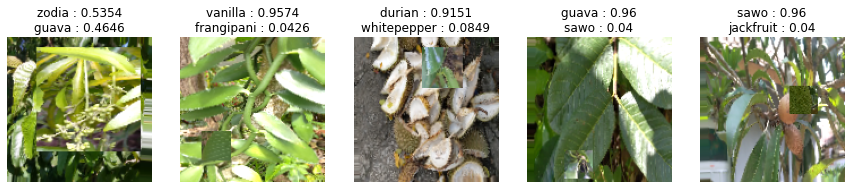

In [ ]:
# hiển thị 1 số bức ảnh sau khi đã áp dụng cutmix
sample_x, sample_y = next(train_generator)
fig, ax = plt.subplots(1,5,figsize = (15,3))
for i,axi in enumerate(ax.flatten()):
    axi.imshow(sample_x[i])
    axi.axis('off')
    first_max = np.argmax(sample_y[i])
    second_max = np.argsort(sample_y[i])[-2]
    axi.set_title(f'{classes[first_max]} : {round(sample_y[i][first_max],4)}\n{classes[second_max]} : {round(sample_y[i][second_max],4)}')

In [ ]:
def create_model():
    '''
    Return: 
        CNN model with 13 layers.
    '''
    
    model = tf.keras.models.Sequential([
        tf.keras.layers.Conv2D(8,(3,3),padding = 'same',activation = 'relu', input_shape = train_data_gen.image_shape,name = 'Layer1'),
        tf.keras.layers.BatchNormalization(momentum=0.95, epsilon=0.005, beta_initializer=tf.keras.initializers.RandomNormal(mean=0.0, stddev=0.05), gamma_initializer=tf.keras.initializers.Constant(value = 0.9)),
        tf.keras.layers.Conv2D(16,(3,3),padding = 'same',activation = 'relu',name = 'Layer2'),
        tf.keras.layers.BatchNormalization(momentum=0.95, epsilon=0.005, beta_initializer=tf.keras.initializers.RandomNormal(mean=0.0, stddev=0.05), gamma_initializer=tf.keras.initializers.Constant(value = 0.9)),
        tf.keras.layers.MaxPooling2D((2,2),name = 'Layer3'),

        tf.keras.layers.Conv2D(32,(3,3),padding = 'same',activation = 'relu',name = 'Layer4'),
        tf.keras.layers.BatchNormalization(momentum=0.95, epsilon=0.005, beta_initializer=tf.keras.initializers.RandomNormal(mean=0.0, stddev=0.05), gamma_initializer=tf.keras.initializers.Constant(value = 0.9)),
        tf.keras.layers.Conv2D(64,(3,3),padding = 'same',activation = 'relu',name ='Layer5'),
        tf.keras.layers.BatchNormalization(momentum=0.95, epsilon=0.005, beta_initializer=tf.keras.initializers.RandomNormal(mean=0.0, stddev=0.05), gamma_initializer=tf.keras.initializers.Constant(value = 0.9)),
        tf.keras.layers.MaxPooling2D((3,3),name = 'Layer6'),

        tf.keras.layers.Conv2D(128,(3,3),padding = 'same',activation = 'relu',name = 'Layer7'),
        tf.keras.layers.BatchNormalization(momentum=0.95, epsilon=0.005, beta_initializer=tf.keras.initializers.RandomNormal(mean=0.0, stddev=0.05), gamma_initializer=tf.keras.initializers.Constant(value = 0.9)),
        tf.keras.layers.Conv2D(256,(3,3),padding = 'same',activation = 'relu',name = 'Layer8'),
        tf.keras.layers.BatchNormalization(momentum=0.95, epsilon=0.005, beta_initializer=tf.keras.initializers.RandomNormal(mean=0.0, stddev=0.05), gamma_initializer=tf.keras.initializers.Constant(value = 0.9)),
        tf.keras.layers.MaxPooling2D((5,5),name = 'Layer9'),

        tf.keras.layers.Flatten(name = 'Layer10'),
        tf.keras.layers.Dense(100,'relu',name = 'Layer11'),
        tf.keras.layers.BatchNormalization(momentum=0.95, epsilon=0.005, beta_initializer=tf.keras.initializers.RandomNormal(mean=0.0, stddev=0.05), gamma_initializer=tf.keras.initializers.Constant(value = 0.9)),
        tf.keras.layers.Dropout(rate = 0.5,name = 'Layer12'),

        tf.keras.layers.Dense(26,'softmax',name = 'Layer13')
    ])
    ## TYPE YOUR CODE for task 8 here:

    return model
model = create_model()

In [ ]:
# cutmix
import datetime
model.compile('adam','categorical_crossentropy',['accuracy'])

logdir = os.path.join('logs2', datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
tsb=tf.keras.callbacks.TensorBoard(log_dir=logdir,histogram_freq=1)
mdcp = tf.keras.callbacks.ModelCheckpoint('/content/drive/MyDrive/asia_plant_cutmix.h5',verbose = 1,monitor = 'val_accuracy',save_best_only=True)
rdlr = tf.keras.callbacks.ReduceLROnPlateau(monitor ='val_accuracy', patience = 3)
# es = tf.keras.callbacks.EarlyStopping(monitor='val_accuracy', min_delta=0.01,patience=3)

history = model.fit(train_generator,validation_data = validation_generator,
                    steps_per_epoch=train_generator.samples/train_generator.batch_size,
                    validation_steps=validation_generator.samples // BATCH_SIZE,epochs=10,callbacks = [rdlr,mdcp,tsb])

Epoch 1/10
2080/2079 [==============================] - ETA: 0s - loss: 2.4320 - accuracy: 0.3699
Epoch 1: val_accuracy improved from -inf to 0.71815, saving model to /content/drive/MyDrive/asia_plant_cutmix.h5
2079/2079 [==============================] - 1875s 895ms/step - loss: 2.4320 - accuracy: 0.3699 - val_loss: 1.0714 - val_accuracy: 0.7181 - lr: 0.0010
Epoch 2/10
2080/2079 [==============================] - ETA: 0s - loss: 1.8605 - accuracy: 0.5846
Epoch 2: val_accuracy improved from 0.71815 to 0.87512, saving model to /content/drive/MyDrive/asia_plant_cutmix.h5
2079/2079 [==============================] - 1841s 886ms/step - loss: 1.8605 - accuracy: 0.5846 - val_loss: 0.5482 - val_accuracy: 0.8751 - lr: 0.0010
Epoch 3/10
2080/2079 [==============================] - ETA: 0s - loss: 1.6029 - accuracy: 0.6822
Epoch 3: val_accuracy improved from 0.87512 to 0.92825, saving model to /content/drive/MyDrive/asia_plant_cutmix.h5
2079/2079 [==============================] - 1919s 923ms/st

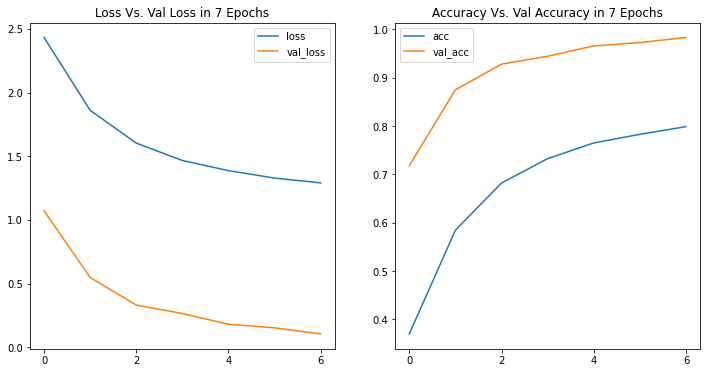

Nhìn chung, cũng giống như mixup, model perform trên tập val tốt hơn nhiều so với tập train, sau 7 epochs model đạt được accuracy là 0.9834, có tốt hơn so với dữ liệu không cutmix, nhưng model train khá lâu > 30 phút cho 1 epochs (gấp đôi thời gian so với không cutmix)

### áp dụng efficientb0 và cutmix


In [ ]:
efnb0 = tf.keras.applications.efficientnet.EfficientNetB0(weights='imagenet', include_top=False, input_shape=(IMG_SIZE,IMG_SIZE,3), classes=26)

model =  tf.keras.Sequential()
model.add(efnb0)
model.add(tf.keras.layers.GlobalAveragePooling2D())
model.add(tf.keras.layers.Dropout(0.5))
model.add(tf.keras.layers.Dense(256, activation='softmax'))
model.add(tf.keras.layers.Dropout(0.5))
model.add(tf.keras.layers.Dense(26, activation='softmax'))

model.summary()

model.compile('adam','categorical_crossentropy',['accuracy'])
import datetime


logdir = os.path.join('logs2', datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
tsb=tf.keras.callbacks.TensorBoard(log_dir=logdir,histogram_freq=1)
mdcp = tf.keras.callbacks.ModelCheckpoint('/content/drive/MyDrive/asia_plant_efficientnet_cutmix.h5',verbose = 1,monitor = 'val_accuracy',save_best_only=True)
rdlr = tf.keras.callbacks.ReduceLROnPlateau(monitor ='val_accuracy', patience = 3)
# es = tf.keras.callbacks.EarlyStopping(monitor='val_accuracy', min_delta=0.01,patience=3)

In [ ]:
history = model.fit(train_generator,validation_data = validation_generator,
                    steps_per_epoch=train_generator.samples/train_generator.batch_size,
                    validation_steps=validation_generator.samples // BATCH_SIZE,epochs=10,callbacks = [rdlr,mdcp,tsb])

Epoch 1/10
2080/2079 [==============================] - ETA: 0s - loss: 3.1802 - accuracy: 0.0814
Epoch 1: val_accuracy improved from -inf to 0.06418, saving model to /content/drive/MyDrive/asia_plant_efficientnet_cutmix.h5
2079/2079 [==============================] - 3207s 2s/step - loss: 3.1802 - accuracy: 0.0814 - val_loss: 3.2658 - val_accuracy: 0.0642 - lr: 0.0010
Epoch 2/10
2080/2079 [==============================] - ETA: 0s - loss: 3.1185 - accuracy: 0.0903
Epoch 2: val_accuracy did not improve from 0.06418
2079/2079 [==============================] - 3256s 2s/step - loss: 3.1185 - accuracy: 0.0903 - val_loss: 3.3034 - val_accuracy: 0.0382 - lr: 0.0010
Epoch 3/10
2080/2079 [==============================] - ETA: 0s - loss: 3.0696 - accuracy: 0.0998
Epoch 3: val_accuracy did not improve from 0.06418
2079/2079 [==============================] - 3272s 2s/step - loss: 3.0696 - accuracy: 0.0998 - val_loss: 3.3561 - val_accuracy: 0.0587 - lr: 0.0010
Epoch 4/10
2080/2079 [============

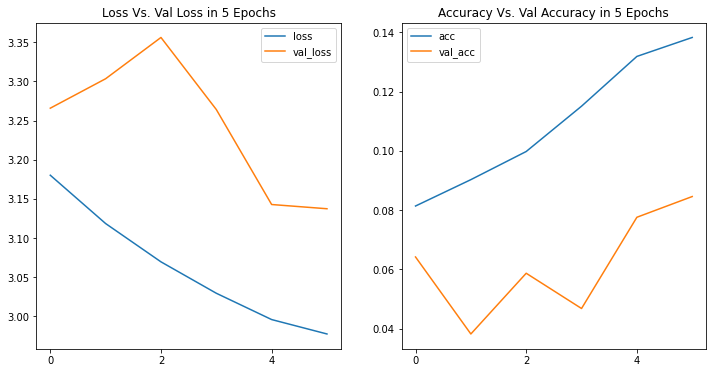

Model efficientnet với cutmix hoạt động tệ

### lọc dữ liệu trùng nhau (deduplication)

sử dụng tool fifty one

link: https://voxel51.com/docs/fiftyone/recipes/image_deduplication.html

In [ ]:
!pip install --upgrade pip setuptools wheel
!pip install fiftyone

!pip install opencv-python-headless==4.5.2.52

In [33]:
import fiftyone as fo
from fiftyone import ViewField as F
import fiftyone.core.utils as fou
from collections import Counter

In [57]:
# Print summary information about the dataset
dataset = fo.Dataset.from_dir("/content/bali-26_train/bali-26_train", dataset_type=fo.types.ImageClassificationDirectoryTree)

# Compute file hashes Iterate over the samples and compute their file hashes:
for sample in dataset:
    sample["file_hash"] = fou.compute_filehash(sample.filepath)
    sample.save()

'''Check for duplicates Now let's use a simple Python statement to locate the duplicate files in the dataset, 
i.e., those with the same file hashses:'''

filehash_counts = Counter(sample.file_hash for sample in dataset)
dup_filehashes = [k for k, v in filehash_counts.items() if v > 1]
print("Number of duplicate file hashes: %d" % len(dup_filehashes))

# Now let's create a view that contains only the samples with these duplicate file hashes:

dup_view = (dataset
    # Extract samples with duplicate file hashes
    .match(F("file_hash").is_in(dup_filehashes))
    # Sort by file hash so duplicates will be adjacent
    .sort_by("file_hash")
)

print("Number of images that have a duplicate: %d" % len(dup_view))
print("Number of duplicates: %d" % (len(dup_view) - len(dup_filehashes)))

 100% |█████████████| 41608/41608 [26.2s elapsed, 0s remaining, 1.8K samples/s]      
Number of duplicate file hashes: 1
Number of images that have a duplicate: 2
Number of duplicates: 1


In [62]:
# delete folder
# !rm -rf '/content/bali-26_train'
# !rm -rf '/content/bali-26_test'

In [ ]:
from PIL import Image
import os, sys

path = "/content/bali-26_train/bali-26_train/"
dirs = os.listdir( path )

def resize():
    for item in dirs:
      sub_dirs = os.listdir( path+item )
      for sub_item in sub_dirs:
          if os.path.isfile(path+item+'/'+sub_item):
              im = Image.open(path+item+'/'+sub_item)
              imResize = im.resize((200,200), Image.ANTIALIAS)
              imResize.save(path+item+'/'+sub_item, 'JPEG', quality=90)

resize()

In [48]:
i = 0
gen = tf.keras.preprocessing.image.ImageDataGenerator()
for batch in gen.flow_from_directory('/content/bali-26_train/bali-26_train', target_size=(128,128),
    class_mode='categorical', shuffle=False, batch_size=32,
    save_to_dir='/content/bali-26_train/augmented', save_prefix='hi'):

    i += 1
    if i > 20: # save 20 images
        break  # otherwise the generator would loop indefinitely

Found 41608 images belonging to 27 classes.


In [49]:
len(os.listdir('/content/bali-26_train/augmented'))

672